# Breast Cancer Prediction using Machine Learning Algorithms

         id diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
0    842302         M        17.99         10.38          122.80     1001.0   
1    842517         M        20.57         17.77          132.90     1326.0   
2  84300903         M        19.69         21.25          130.00     1203.0   
3  84348301         M        11.42         20.38           77.58      386.1   
4  84358402         M        20.29         14.34          135.10     1297.0   

   smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
0          0.11840           0.27760          0.3001              0.14710   
1          0.08474           0.07864          0.0869              0.07017   
2          0.10960           0.15990          0.1974              0.12790   
3          0.14250           0.28390          0.2414              0.10520   
4          0.10030           0.13280          0.1980              0.10430   

   ...  texture_worst  perimeter_worst  area_worst  smoothness

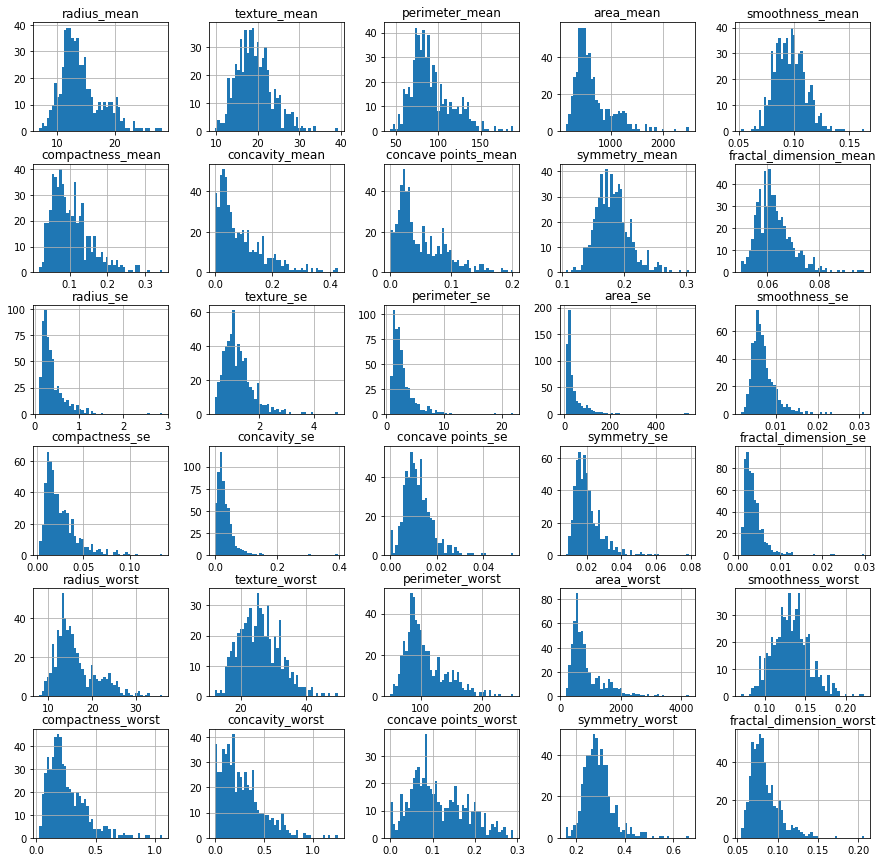

In [2]:
# import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix, make_scorer
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
import warnings
warnings.filterwarnings("ignore")

# read data
df = pd.read_csv(r'E:/Pycharm&&PythonThings/Users/BASIL/PycharmProjects/Wabuko/Breast-Cancer-Prediction/data.csv')

# Read in the data
df = pd.read_csv('data.csv')



# GMF Data Cleaning - remove outliers
df = df[df['radius_mean'] / df['perimeter_mean'] < 0.2]

# data overview
print(df.head())

# shuffle the data because data in series
df = df.sample(frac=1)

print(df.iloc[:10])

# drop the unnamed and id columns.
df = df.drop(columns=['Unnamed: 32', 'id'])
print(df)

# no of rows and columns
print(df.shape)

# Checking the data types
print(df.dtypes)

# check for null values in dataset
print(df.isnull().values.any())

# Count class labels
print(df['diagnosis'].value_counts())

# Data visualization to create histogram
df.hist(bins=50, figsize=(15, 15))
plt.show()



diagnosis
B    357
M    212
dtype: int64


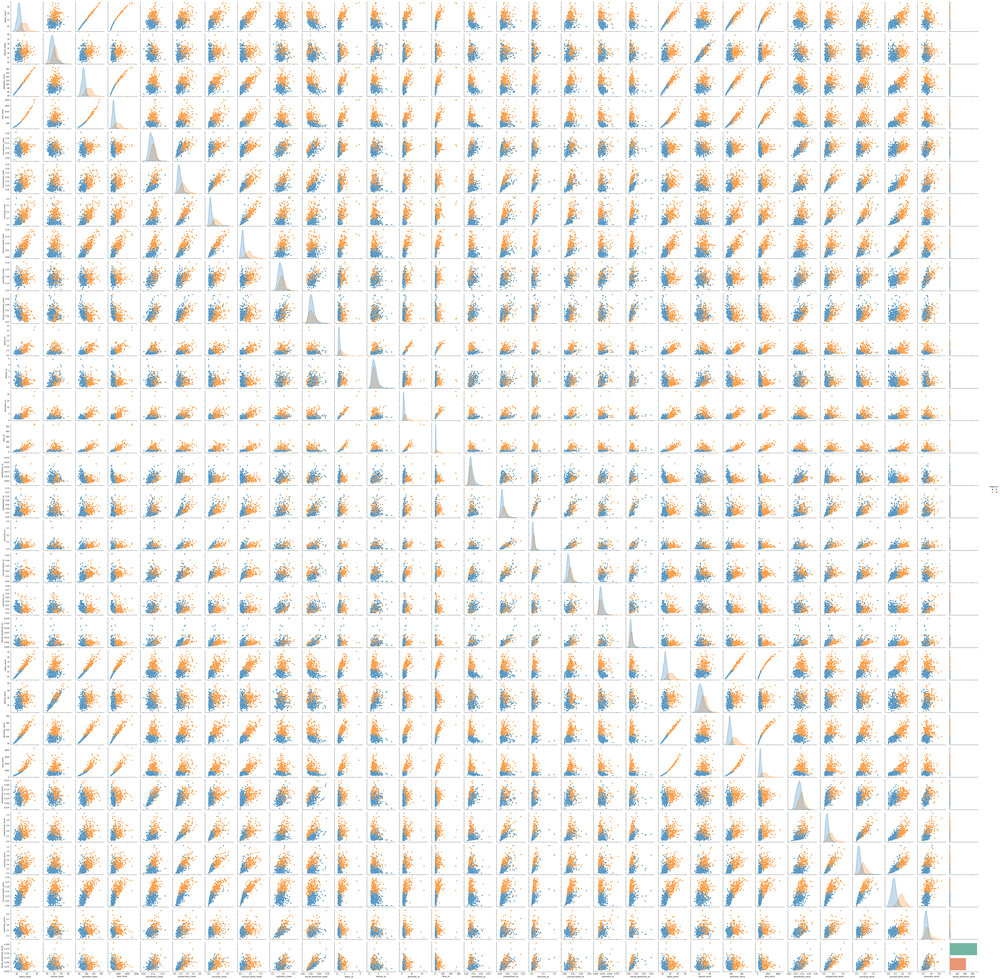

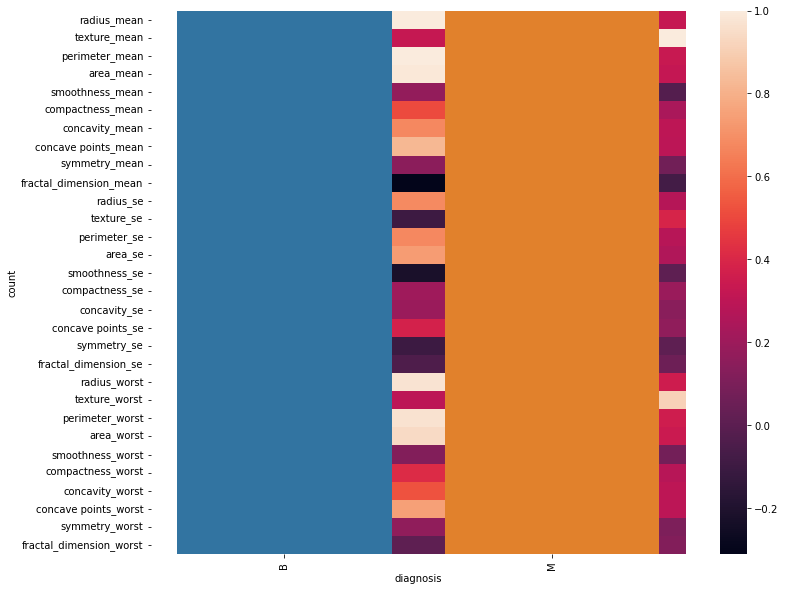

(278, 30) (120, 30) (278,) (120,)
Naive Bayes : 
Training Set Accuracy :  0.9496402877697842
Test Set Accuracy 0.9416666666666667 ROC 0.9349427168576104
True Positive:  [6 7 7 7 6 7 8 7 7 5]
True Negative:  [19 21 20 19 21 20 20 19 20 18]
False Negative:  [1 0 0 0 1 0 0 1 0 2]
False Positive:  [2 0 1 2 0 1 0 1 0 2]
Accuracy:  [0.89 1.   0.96 0.93 0.96 0.96 1.   0.93 1.   0.85]
****************************************************
Logistic Regression : 
Training Set Accuracy :  0.9496402877697842
Test Set Accuracy 0.95 ROC 0.9263502454991817
True Positive:  [6 4 6 7 5 6 8 8 6 6]
True Negative:  [21 21 21 20 21 19 20 20 20 17]
False Negative:  [1 3 1 0 2 1 0 0 1 1]
False Positive:  [0 0 0 1 0 2 0 0 0 3]
Accuracy:  [0.96 0.89 0.96 0.96 0.93 0.89 1.   1.   0.96 0.85]
****************************************************
Support Vector Machine : 
Training Set Accuracy :  0.9676258992805755
Test Set Accuracy 0.9583333333333334 ROC 0.9316693944353518
True Positive:  [6 5 6 7 6 6 8 8 6 6]
True N

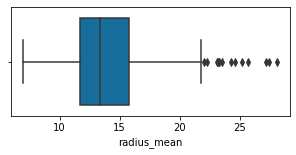

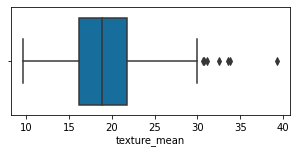

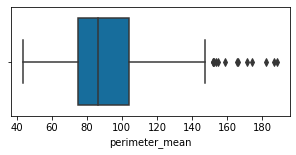

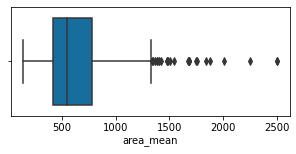

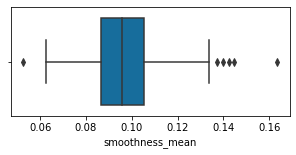

...

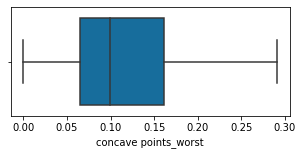

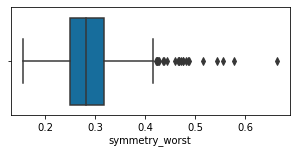

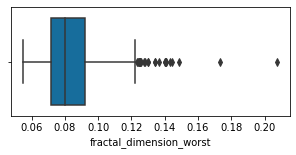

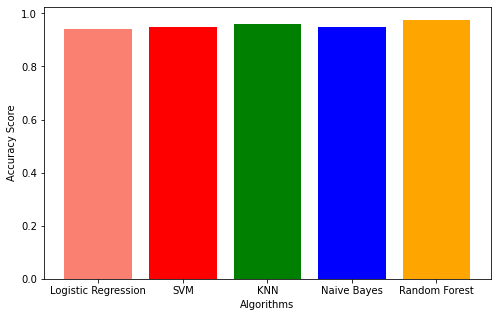

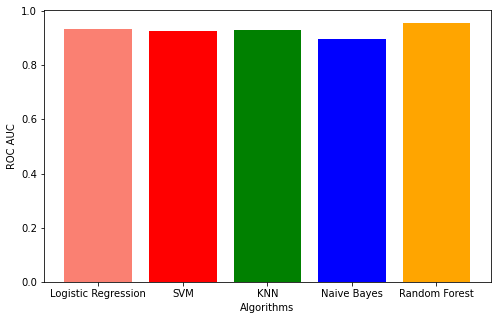

In [3]:
# Scatter matrix to check correlation between two attributes
sns.pairplot(df, hue='diagnosis')

# Count each label
ax = sns.countplot(y='diagnosis', data=df, palette='Set2')

# Finding correlation
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(df.corr(), ax=ax)

print(df.groupby('diagnosis').size())
sns.countplot(df['diagnosis'], label="Count")
plt.show()

# box plot to check outlier in each category
def boxPlot(dff):
    d = dff.drop(columns=['diagnosis'])
    for column in d:
        plt.figure(figsize=(5, 2))
        sns.boxplot(x=column, data=d, palette="colorblind")


boxPlot(df)

# Quartile range

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
inter_quartile_range = Q3 - Q1

def gmf(df):
    # GMF technique
    # Calculate Z-score for each numeric attribute
    z = np.abs(stats.zscore(df._get_numeric_data()))
    df = df[(z < 3).all(axis=1)]
    return df

df_out = gmf(df_out)


# quartiles and interquartile range

df_out = df[~((df < (Q1 - (1.5 * inter_quartile_range))) | (df > (Q3 + (1.5 * inter_quartile_range)))).any(axis=1)]
df.shape, df_out.shape

# Separate labels and features
X = df_out.drop(columns=['diagnosis'])
y = df_out['diagnosis']

# Convert the M to 1 and B to 0
label = LabelEncoder()
y = label.fit_transform(y)
y[:20]

"""# Spilt the train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
# we used 30% test data
# check the size before beginning
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)"""

# split the data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
# create a 5-fold cross-validation iterator
cv_iterator = KFold(n_splits=5, shuffle=True, random_state=42)
# perform cross-validation on the training data
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=cv_iterator)


# cross validation function
def tn(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[0, 0]


def fp(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[0, 1]


def fn(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[1, 0]


def tp(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[1, 1]


def acc(y_true, y_pred):
    return accuracy(y_true, y_pred)

# custom accuracy
def accuracy(y_true, y_pred):
    cnf_matrix = confusion_matrix(y_true, y_pred)
    N = sum(map(sum, cnf_matrix))
    tp = cnf_matrix[1, 1]
    tn = cnf_matrix[0, 0]
    return round((tp + tn) / N, 2)

# cross validation purpose
scoring = {'accuracy': make_scorer(metrics.accuracy_score), 'prec': 'precision'}
scoring = {'tp': make_scorer(tp), 'tn': make_scorer(tn),
           'fp': make_scorer(fp), 'fn': make_scorer(fn),
           'acc': make_scorer(acc)}

def print_result(result):
    print("True Positive: ", result['test_tp'])
    print("True Negative: ", result['test_tn'])
    print("False Negative: ", result['test_fn'])
    print("False Positive: ", result['test_fp'])
    print("Accuracy: ", result['test_acc'])

# acc list and rcc list stores the output of each model
acc = []
roc = []

# Naive Bayes
model = GaussianNB()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("Naive Bayes : ")
print("Training Set Accuracy : ", ac_train)
print("Test Set Accuracy {0} ROC {1}".format(ac, rc))

# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

# Logistic Regression
LR = LogisticRegression()
LR.fit(X_train, y_train)
LR.score(X_train, y_train)
y_pred = LR.predict(X_test)
y_pred_train = model.predict(X_train)

# find accuracy
ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
# Code for ROC_AUC curve
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("****************************************************")
print("Logistic Regression : ")
print("Training Set Accuracy : ", ac_train)
print("Test Set Accuracy {0} ROC {1}".format(ac, rc))

# cross validation shows how accurate our model is
result = cross_validate(LR, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

# Support Vector Machine
model = SVC(gamma='auto', kernel='linear')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("****************************************************")
print("Support Vector Machine : ")
print("Training Set Accuracy : ", ac_train)
print("Test Set Accuracy {0} ROC {1}".format(ac, rc))

# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

# KNN
model = KNeighborsClassifier(n_neighbors=9, n_jobs=-1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("****************************************************")
print("K-Nearest Neighbors : ")
print("Training Set Accuracy : ", ac_train)
print("Accuracy {0} ROC {1}".format(ac, rc))

# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

# Random Forest
model = RandomForestClassifier(n_estimators=20, max_depth=10)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print("****************************************************")
print("Random Forest : ")
print("Training Set Accuracy : ", ac_train)
print("Accuracy {0} ROC {1}".format(ac, rc))

# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)# Plot the bar graph for accuracy and  roc-auc

# accuracy score
plt.figure(figsize=(8, 5))
plt.bar(['Logistic Regression', 'SVM', 'KNN', 'Naive Bayes', 'Random Forest'], acc,
        color=['salmon', 'r', 'g', 'b', 'orange'], label='Accuracy')
plt.ylabel('Accuracy Score')
plt.xlabel('Algorithms')

# roc-auc
plt.figure(figsize=(8, 5))
plt.bar(['Logistic Regression', 'SVM', 'KNN', 'Naive Bayes', 'Random Forest'], roc,
        color=['salmon', 'r', 'g', 'b', 'orange'], label='ROC AUC')
plt.ylabel('ROC AUC')
plt.xlabel('Algorithms')
plt.show()

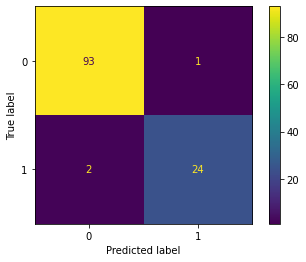

In [6]:
from sklearn.metrics import *
plot_confusion_matrix(model, X_test, y_test)

In [9]:
print("weighted precision: {:.2f}".format(precision_score(y_test, y_pred, average="weighted")))
print("weighted recall: {:.2f}".format(recall_score(y_test, y_pred, average="weighted")))
print("weighted F1 score: {:.2f}".format(f1_score(y_test, y_pred, average="weighted")))

weighted precision: 0.97
weighted recall: 0.97
weighted F1 score: 0.97


In [11]:
y_pred = rfclf.predict(X_test)
confusion_matrix(y_test, y_pred)
plot_confusion_matrix(rfclf, X_test, y_test)

NameError: name 'rfclf' is not defined

In [12]:
print("weighted precision: {:.2f}".format(precision_score(y_test, y_pred, average="weighted")))
print("weighted recall: {:.2f}".format(recall_score(y_test, y_pred, average="weighted")))
print("weighted F1 score: {:.2f}".format(f1_score(y_test, y_pred, average="weighted")))

weighted precision: 0.97
weighted recall: 0.97
weighted F1 score: 0.97


In [14]:
from sklearn.metrics import *
plot_confusion_matrix(classifier, X_test, y_test)

NameError: name 'classifier' is not defined

In [5]:
from sklearn.decomposition import PCA
import pandas as pd
# from sklearn.datasets import load_breast_cancer

# Load the breast cancer dataset
data = pd.read_csv(r'E:/Pycharm&&PythonThings/Users/BASIL/PycharmProjects/Wabuko/Breast-Cancer-Prediction/data.csv')

X, y = data.data, data.target

# Apply PCA for feature selection
pca = PCA(n_components=5)  # Select the top 5 principal components
X_pca = pca.fit_transform(X)
X_pca

NameError: name 'load' is not defined

In [6]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# Assuming X is the input data and y is the target variable
lda = LinearDiscriminantAnalysis()
X_lda = lda.fit_transform(X, y)
X_lda

NameError: name 'X' is not defined

In [7]:
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression

data = pd.read_csv(r'E:/Pycharm&&PythonThings/Users/BASIL/PycharmProjects/Wabuko/Breast-Cancer-Prediction/data.csv')
X, y = data.data, data.target

kf = KFold(n_splits=5, shuffle=True)
scores = []
for train_index, test_index in kf.split(X):
    X_train, y_train = X[train_index], y[train_index]
    X_test, y_test = X[test_index], y[test_index]
    clf = LogisticRegression()
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    scores.append(score)

mean_score = sum(scores) / len(scores)
print("Mean accuracy:", mean_score)


E:\AnacondaNew\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
E:\AnacondaNew\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_

Mean accuracy: 0.9437043937276821


E:\AnacondaNew\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [8]:
# Cross validation using 5-fold
from sklearn.model_selection import KFold
from sklearn.linear_model import LogisticRegression

data = pd.read_csv(r'E:/Pycharm&&PythonThings/Users/BASIL/PycharmProjects/Wabuko/Breast-Cancer-Prediction/data.csv')X, y = data.data, data.target
kf = KFold(n_splits=5, shuffle=True)
scores = []
for train_index, test_index in kf.split(X):
    X_train, y_train = X[train_index], y[train_index]
    X_test, y_test = X[test_index], y[test_index]
    clf = LogisticRegression()
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    scores.append(score)

mean_score = sum(scores) / len(scores)
print("Mean accuracy:", mean_score)


E:\AnacondaNew\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
E:\AnacondaNew\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_

Mean accuracy: 0.9490296537804689


E:\AnacondaNew\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [9]:
from sklearn.mixture import GaussianMixture

# Load the breast cancer dataset
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()

# Split the data into features and target
X = data.data
y = data.target

# Initialize a Gaussian Mixture Model with two components
gmf = GaussianMixture(n_components=2, random_state=42)

# Fit the model to the data
gmf.fit(X)

# Use the model to extract the most important features
importance_scores = gmf.score_samples(X)
important_features = X[:, importance_scores > threshold]


NameError: name 'threshold' is not defined

In [12]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.datasets import load_breast_cancer
import pandas as pd

# Load breast cancer dataset
data = pd.read_csv(r'E:/Pycharm&&PythonThings/Users/BASIL/PycharmProjects/Wabuko/Breast-Cancer-Prediction/data.csv')
X, y = data.data, data.target

# Select top 10 features based on ANOVA F-value
selector = SelectKBest(score_func=f_classif, k=10)
X_new = selector.fit_transform(data.data, data.target)

# Print selected features
feature_names = data.feature_names
selected_features = [feature_names[i] for i in selector.get_support(indices=True)]
print(selected_features)


AttributeError: 'DataFrame' object has no attribute 'data'